In [65]:
import numpy as np 
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import keras
from keras.layers import Dense, Activation, Dropout, Reshape, Permute, Conv2D, Conv2DTranspose,MaxPooling2D, GlobalMaxPool2D,concatenate, add

import tensorflow as tf
from keras.models import Model, load_model
from keras.layers import Input, BatchNormalization, Activation, Dense, Dropout
# from keras.layers.core import Lambda, RepeatVector, Reshape
# from keras.layers.convolutional import Conv2D, Conv2DTranspose
# from keras.layers.pooling import MaxPooling2D, GlobalMaxPool2D
# from keras.layers.merge import concatenate, add
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau
from keras.optimizers import Adam
import os
# for dirname, _, filenames in os.walk('/kaggle/input'):
#     for filename in filenames:
#         print(os.path.join(dirname, filename))

# # BigQuery
# from google.cloud import bigquery
# bigquery_client = bigquery.Client(project='YOUR PROJECT ID')

# # # Cloud Storage
# from google.cloud import storage
# storage_client = storage.Client(project='qwiklabs-gcp-00-0fc3823b0d2a')

In [15]:
df = pd.read_csv('/kaggle/input/deepglobe-road-extraction-dataset/metadata.csv')
df.head()

,image_id,split,sat_image_path,mask_path
0,100034,train,train/100034_sat.jpg,train/100034_mask.png
1,100081,train,train/100081_sat.jpg,train/100081_mask.png
2,100129,train,train/100129_sat.jpg,train/100129_mask.png
3,100703,train,train/100703_sat.jpg,train/100703_mask.png
4,100712,train,train/100712_sat.jpg,train/100712_mask.png


In [16]:
df.split.value_counts()

split
train    6226
valid    1243
test     1101
Name: count, dtype: int64

In [17]:
df.shape

(8570, 4)

In [18]:
df.isnull().sum()

image_id             0
split                0
sat_image_path       0
mask_path         2344
dtype: int64

In [19]:
df1 = df[df['split'] == 'train']
df1.split.value_counts()

split
train    6226
Name: count, dtype: int64

In [20]:
path = '/kaggle/input/deepglobe-road-extraction-dataset/'

In [21]:
df1.loc[:,'sat_image_path'] = df1['sat_image_path'].apply(lambda x : os.path.join(path, x))
df1.loc[:,'mask_path'] = df1['mask_path'].apply(lambda x : os.path.join(path, x))
df1

,image_id,split,sat_image_path,mask_path
0,100034,train,/kaggle/input/deepglobe-road-extraction-datase...,/kaggle/input/deepglobe-road-extraction-datase...
1,100081,train,/kaggle/input/deepglobe-road-extraction-datase...,/kaggle/input/deepglobe-road-extraction-datase...
2,100129,train,/kaggle/input/deepglobe-road-extraction-datase...,/kaggle/input/deepglobe-road-extraction-datase...
3,100703,train,/kaggle/input/deepglobe-road-extraction-datase...,/kaggle/input/deepglobe-road-extraction-datase...
4,100712,train,/kaggle/input/deepglobe-road-extraction-datase...,/kaggle/input/deepglobe-road-extraction-datase...
...,...,...,...,...
6221,999431,train,/kaggle/input/deepglobe-road-extraction-datase...,/kaggle/input/deepglobe-road-extraction-datase...
6222,999531,train,/kaggle/input/deepglobe-road-extraction-datase...,/kaggle/input/deepglobe-road-extraction-datase...
6223,999667,train,/kaggle/input/deepglobe-road-extraction-datase...,/kaggle/input/deepglobe-road-extraction-datase...
6224,999764,train,/kaggle/input/deepglobe-road-extraction-datase...,/kaggle/input/deepglobe-road-extraction-datase...


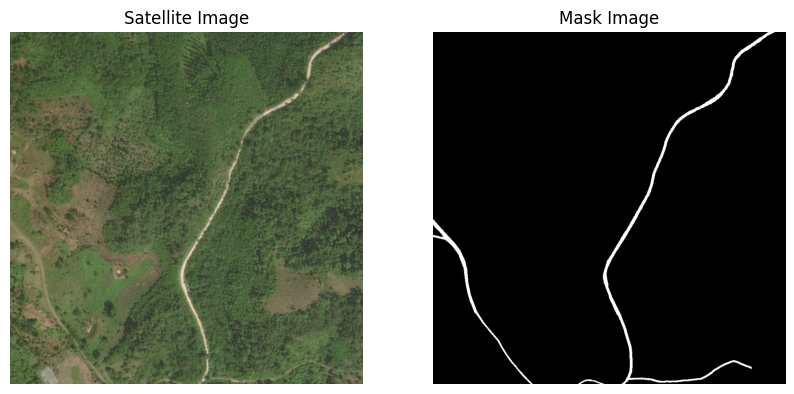

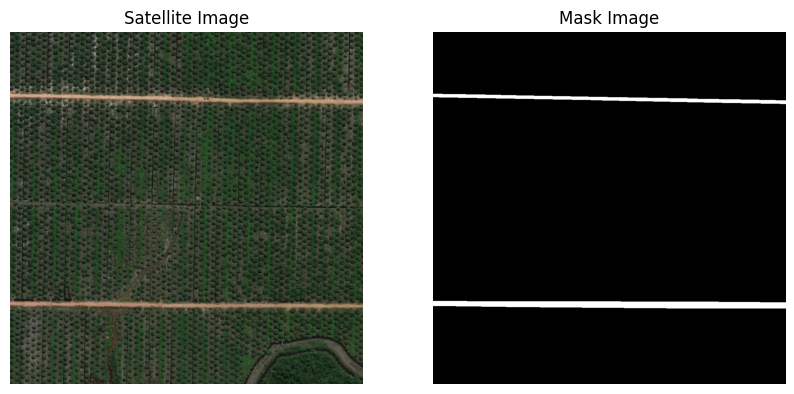

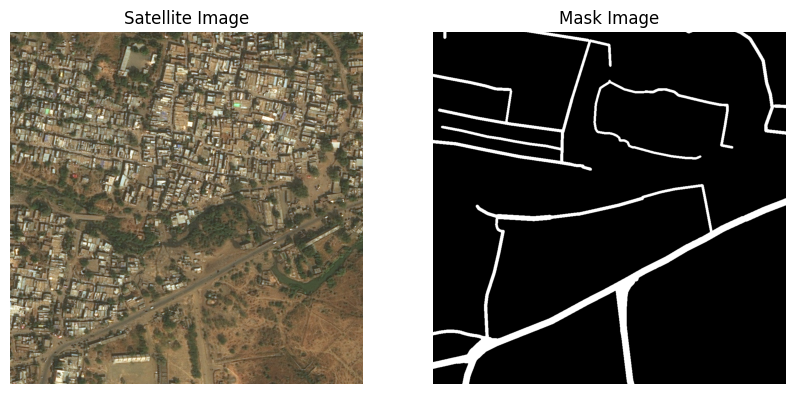

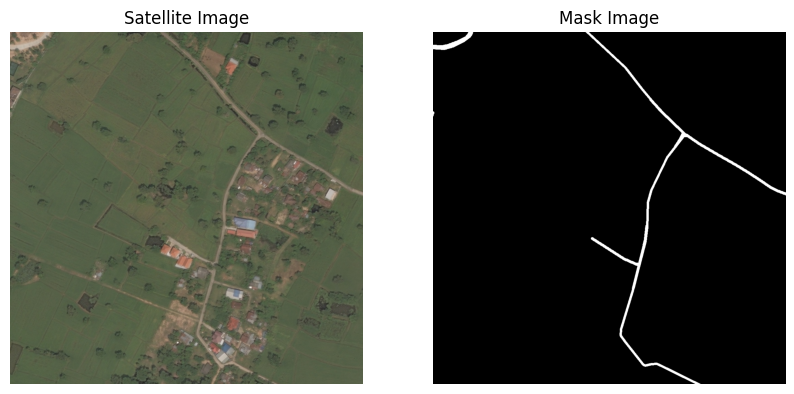

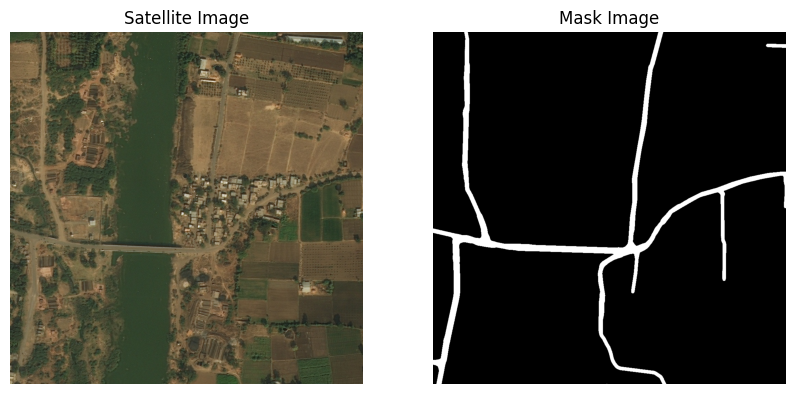

In [22]:
for i in range(5):
    img = cv2.imread(df1['sat_image_path'][i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  
    
    mask = cv2.imread(df1['mask_path'][i], cv2.IMREAD_GRAYSCALE)  

    # Create subplots to display images side by side
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    
    # Display the satellite image
    ax[0].imshow(img)
    ax[0].set_title('Satellite Image')
    ax[0].axis('off')  # Hide axes for a cleaner look
    
    # Display the mask image
    ax[1].imshow(mask, cmap='gray')
    ax[1].set_title('Mask Image')
    ax[1].axis('off')
    
    # Show the images
    plt.show()

In [23]:
def resize_image(image, size):
    # Resize the image to the specified size
    resized_image = cv2.resize(image, size)
    return resized_image

def resize_mask(mask, size):
    # Convert the mask to grayscale
    mask_gray = cv2.cvtColor(mask, cv2.COLOR_RGB2GRAY)
    resized_mask = cv2.resize(mask_gray, size, interpolation=cv2.INTER_NEAREST)
    resized_mask = np.expand_dims(resized_mask, axis=2)
    return resized_mask

In [24]:
target_size = (192,192)
image_list = []

for image_path in df1['sat_image_path']:
  # Load the image and mask
  image = plt.imread(image_path).astype(np.float32)
  #mask = plt.imread(mask_path).astype(np.float32)


  # Resize the image and mask
  resized_image = resize_image(image, target_size)
  #resized_mask = resize_mask(mask, target_size)

  image_list.append(resized_image)
  #mask_list.append(resized_mask)

# Convert the image and mask lists to arrays
image_array = np.array(image_list)
#mask_array = np.array(mask_list)

In [25]:
mask_list = [] 
for mask_path in df1['mask_path']:
  # Load the image and mask
  #image = plt.imread(image_path).astype(np.float32)
  mask = plt.imread(mask_path).astype(np.float32)


  # Resize the image and mask
  #resized_image = resize_image(image, target_size)
  resized_mask = resize_mask(mask, target_size)

  #image_list.append(resized_image)
  mask_list.append(resized_mask)

# Convert the image and mask lists to arrays
#image_array = np.array(image_list)
mask_array = np.array(mask_list)

In [26]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(image_array,mask_array, test_size=0.2, random_state=23)

In [14]:
def conv2d_block(input_tensor, n_filters, kernel_size = 3, batchnorm = True):
    """Function to add 2 convolutional layers with the parameters passed to it"""
    # first layer
    x = Conv2D(filters = n_filters, kernel_size = (kernel_size, kernel_size),\
              kernel_initializer = 'he_normal', padding = 'same')(input_tensor)
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    # second layer
    x = Conv2D(filters = n_filters, kernel_size = (kernel_size, kernel_size),\
              kernel_initializer = 'he_normal', padding = 'same')(input_tensor)
    if batchnorm:
        x = BatchNormalization()(x)
    x = Activation('relu')(x)
    
    return x
  
def get_unet(input_img, n_filters = 16, dropout = 0.1, batchnorm = True):
    # Contracting Path
    c1 = conv2d_block(input_img, n_filters * 1, kernel_size = 3, batchnorm = batchnorm)
    p1 = MaxPooling2D((2, 2))(c1)
    p1 = Dropout(dropout)(p1)
    
    c2 = conv2d_block(p1, n_filters * 2, kernel_size = 3, batchnorm = batchnorm)
    p2 = MaxPooling2D((2, 2))(c2)
    p2 = Dropout(dropout)(p2)
    
    c3 = conv2d_block(p2, n_filters * 4, kernel_size = 3, batchnorm = batchnorm)
    p3 = MaxPooling2D((2, 2))(c3)
    p3 = Dropout(dropout)(p3)
    
    c4 = conv2d_block(p3, n_filters * 8, kernel_size = 3, batchnorm = batchnorm)
    p4 = MaxPooling2D((2, 2))(c4)
    p4 = Dropout(dropout)(p4)
    
    c5 = conv2d_block(p4, n_filters = n_filters * 16, kernel_size = 3, batchnorm = batchnorm)
    
    # Expansive Path
    u6 = Conv2DTranspose(n_filters * 8, (3, 3), strides = (2, 2), padding = 'same')(c5)
    u6 = concatenate([u6, c4])
    u6 = Dropout(dropout)(u6)
    c6 = conv2d_block(u6, n_filters * 8, kernel_size = 3, batchnorm = batchnorm)
    
    u7 = Conv2DTranspose(n_filters * 4, (3, 3), strides = (2, 2), padding = 'same')(c6)
    u7 = concatenate([u7, c3])
    u7 = Dropout(dropout)(u7)
    c7 = conv2d_block(u7, n_filters * 4, kernel_size = 3, batchnorm = batchnorm)
    
    u8 = Conv2DTranspose(n_filters * 2, (3, 3), strides = (2, 2), padding = 'same')(c7)
    u8 = concatenate([u8, c2])
    u8 = Dropout(dropout)(u8)
    c8 = conv2d_block(u8, n_filters * 2, kernel_size = 3, batchnorm = batchnorm)
    
    u9 = Conv2DTranspose(n_filters * 1, (3, 3), strides = (2, 2), padding = 'same')(c8)
    u9 = concatenate([u9, c1])
    u9 = Dropout(dropout)(u9)
    c9 = conv2d_block(u9, n_filters * 1, kernel_size = 3, batchnorm = batchnorm)
    
    outputs = Conv2D(1, (1, 1), activation='sigmoid')(c9)
    model = Model(inputs=[input_img], outputs=[outputs])
    return model

In [66]:
from tensorflow.keras import backend as K
from tensorflow.keras import layers

def dice_coef(y_true, y_pred, smooth=1):
    y_true_f = layers.Flatten()(y_true)
    y_pred_f = layers.Flatten()(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

# Define the Dice Coefficient loss
def dice_coef_loss(y_true, y_pred):
    return 1 - dice_coef(y_true, y_pred)

In [90]:
input_img = Input((192,192, 3), name='img')
model = get_unet(input_img, n_filters=16, dropout=0.05, batchnorm=True)
model.compile(optimizer=Adam(), 
              loss=dice_coef_loss,
              metrics=[tf.keras.metrics.MeanIoU(num_classes=2)])

In [91]:
model.summary()

Model: "functional_25"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ img (InputLayer)    │ (None, 192, 192,  │          0 │ -                 │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_229 (Conv2D) │ (None, 192, 192,  │        448 │ img[0][0]         │
│                     │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 192, 192,  │         64 │ conv2d_229[0][0]  │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_217      │ (None, 192, 192,  │          0 │ batch_normalizat… │
│ (Activation)        │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_48    │ (None, 96, 96,    │          0 │ activation_217[0… │
│ (MaxPooling2D)      │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_96          │ (None, 96, 96,    │          0 │ max_pooling2d_48… │
│ (Dropout)           │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_231 (Conv2D) │ (None, 96, 96,    │      4,640 │ dropout_96[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 96, 96,    │        128 │ conv2d_231[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_219      │ (None, 96, 96,    │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_49    │ (None, 48, 48,    │          0 │ activation_219[0… │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_97          │ (None, 48, 48,    │          0 │ max_pooling2d_49… │
│ (Dropout)           │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_233 (Conv2D) │ (None, 48, 48,    │     18,496 │ dropout_97[0][0]  │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 48, 48,    │        256 │ conv2d_233[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_221      │ (None, 48, 48,    │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_50    │ (None, 24, 24,    │          0 │ activation_221[0… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_98          │ (None, 24, 24,    │          0 │ max_pooling2d_50… │
│ (Dropout)           │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_235 (Conv2D) │ (None, 24, 24,    │     73,856 │ dropout_98[0][0]

 Total params: 1,179,409 (4.50 MB)

 Trainable params: 1,177,937 (4.49 MB)

 Non-trainable params: 1,472 (5.75 KB)

In [92]:
callbacks = [
    EarlyStopping(patience=10, verbose=1),
    ReduceLROnPlateau(factor=0.1, patience=5, min_lr=0.00001, verbose=1)
#     ModelCheckpoint('model-tgs-salt.h5', verbose=1, save_best_only=True, save_weights_only=True)
]
results = model.fit(X_train, y_train, batch_size=32, epochs=50, callbacks=callbacks,\
                    validation_data=(X_test, y_test))


Epoch 1/50
156/156 ━━━━━━━━━━━━━━━━━━━━ 55s 204ms/step - dice_coef: 0.1429 - loss: 0.8571 - mean_io_u_8: 0.4081 - val_dice_coef: 0.2155 - val_loss: 0.7845 - val_mean_io_u_8: 0.4571 - learning_rate: 0.0010
Epoch 2/50
156/156 ━━━━━━━━━━━━━━━━━━━━ 12s 78ms/step - dice_coef: 0.2687 - loss: 0.7313 - mean_io_u_8: 0.4140 - val_dice_coef: 0.0824 - val_loss: 0.9176 - val_mean_io_u_8: 0.4483 - learning_rate: 0.0010
Epoch 3/50
156/156 ━━━━━━━━━━━━━━━━━━━━ 12s 78ms/step - dice_coef: 0.4233 - loss: 0.5767 - mean_io_u_8: 0.4343 - val_dice_coef: 0.1720 - val_loss: 0.8280 - val_mean_io_u_8: 0.4500 - learning_rate: 0.0010
Epoch 4/50
156/156 ━━━━━━━━━━━━━━━━━━━━ 12s 78ms/step - dice_coef: 0.4768 - loss: 0.5232 - mean_io_u_8: 0.4638 - val_dice_coef: 0.3896 - val_loss: 0.6104 - val_mean_io_u_8: 0.4685 - learning_rate: 0.0010
Epoch 5/50
156/156 ━━━━━━━━━━━━━━━━━━━━ 12s 78ms/step - dice_coef: 0.5024 - loss: 0.4976 - mean_io_u_8: 0.4838 - val_dice_coef: 0.5125 - val_loss: 0.4874 - val_mean_io_u_8: 0.5253 - l

In [93]:
IMG_SIZE = [192, 192]

In [94]:
def visualize(display_list):
    plt.figure(figsize=(15, 15))
    title = ['Input Image', 'True Mask', 'Predicted Mask']
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]), cmap='gray')
        plt.axis('off')
    plt.show()

In [95]:
 def show_predictions(sample_image, sample_mask):
    pred_mask = model.predict(sample_image[tf.newaxis, ...])
    pred_mask = pred_mask.reshape(IMG_SIZE[0],IMG_SIZE[1],1)
    visualize([sample_image, sample_mask, pred_mask])

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 782ms/step


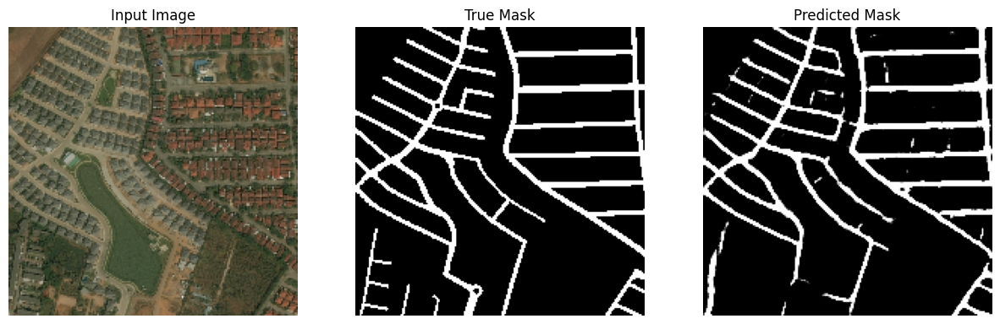

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


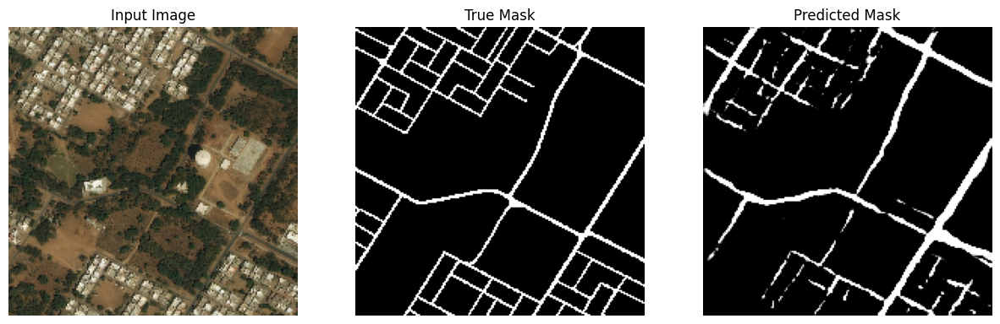

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


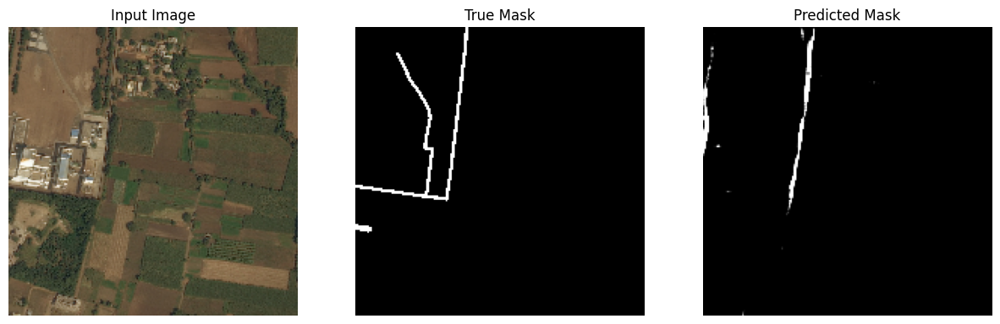

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


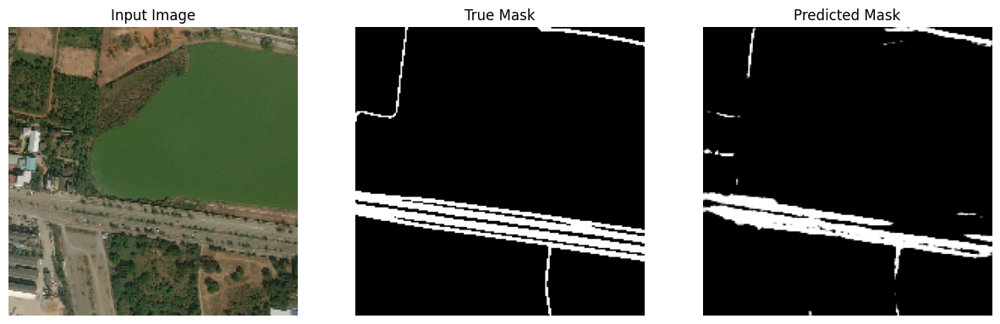

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


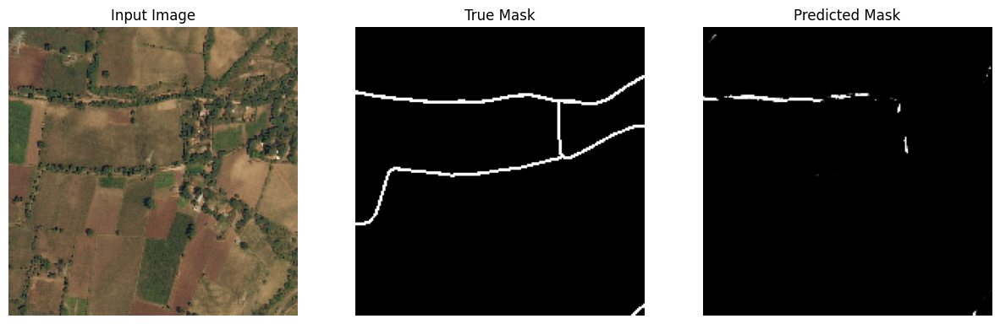

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


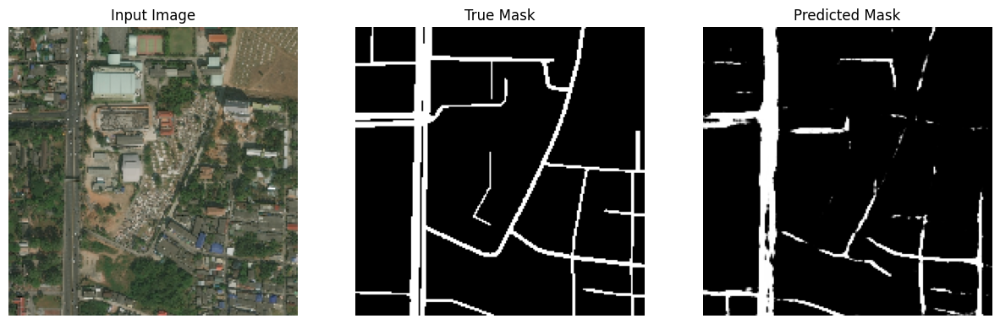

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


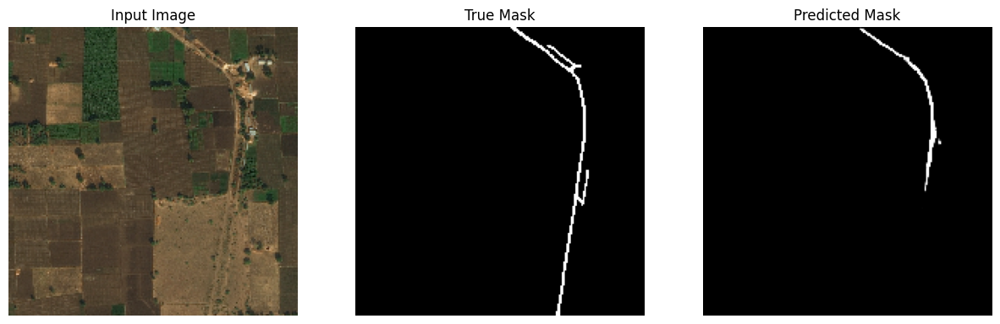

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


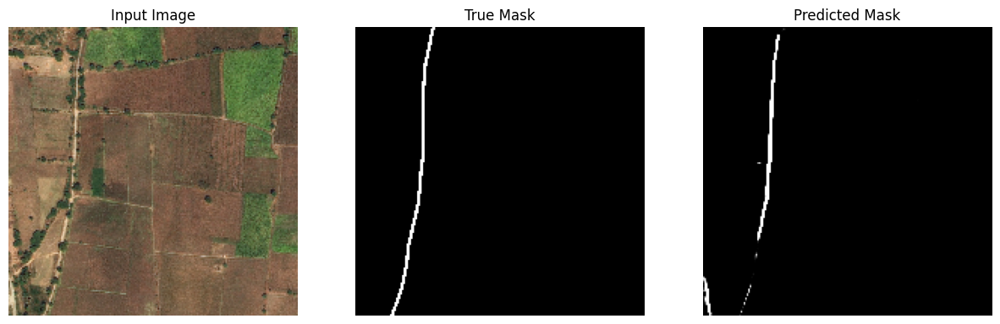

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


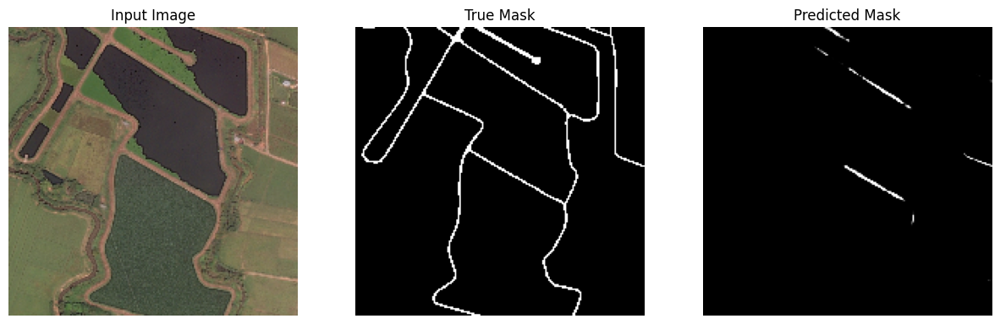

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


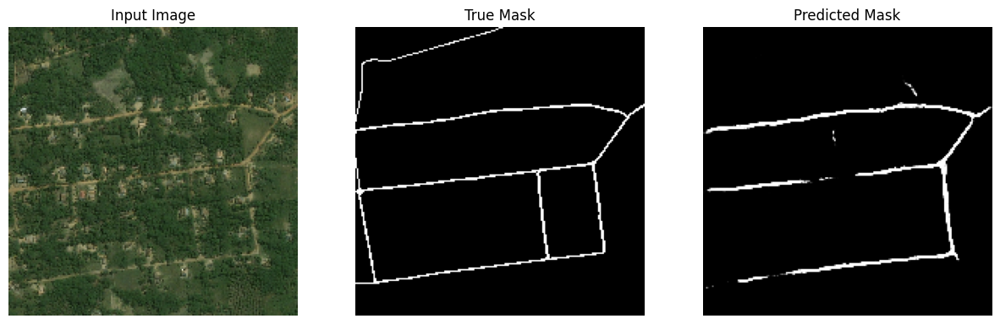

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


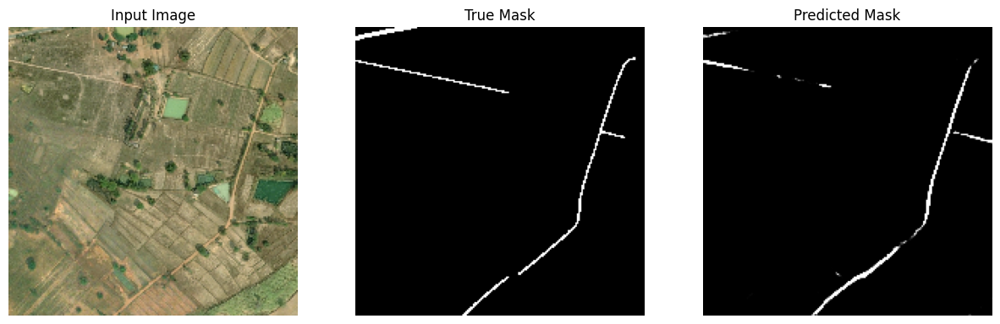

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step


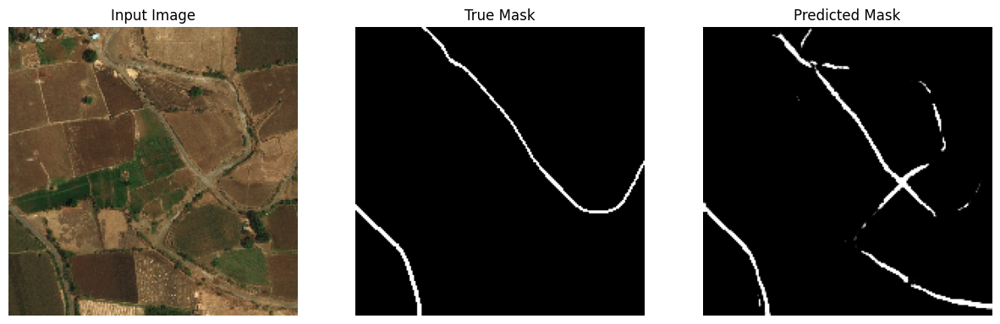

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


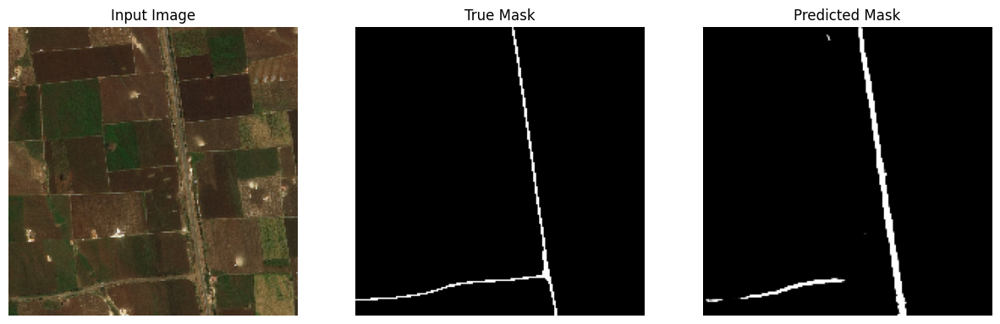

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


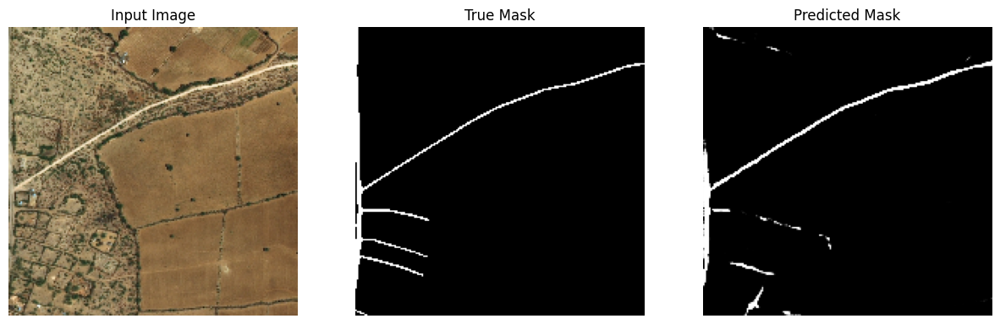

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


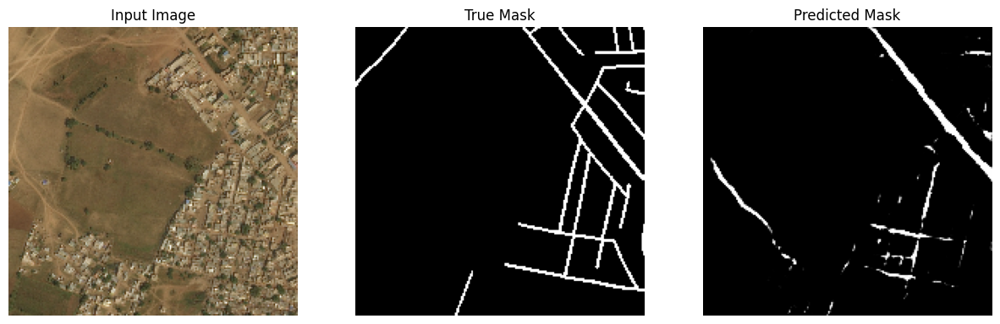

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


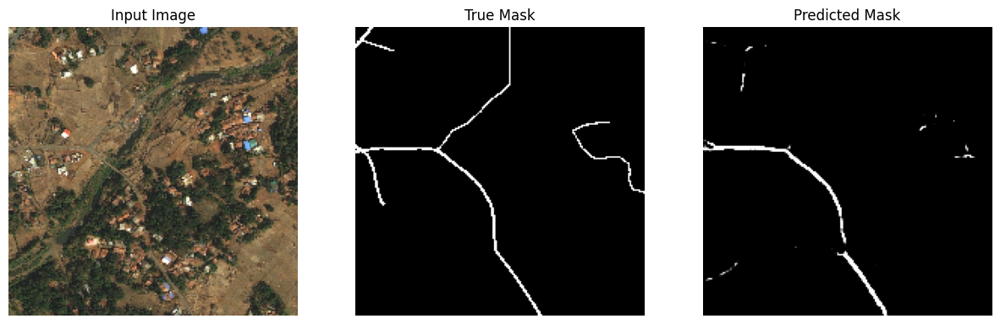

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


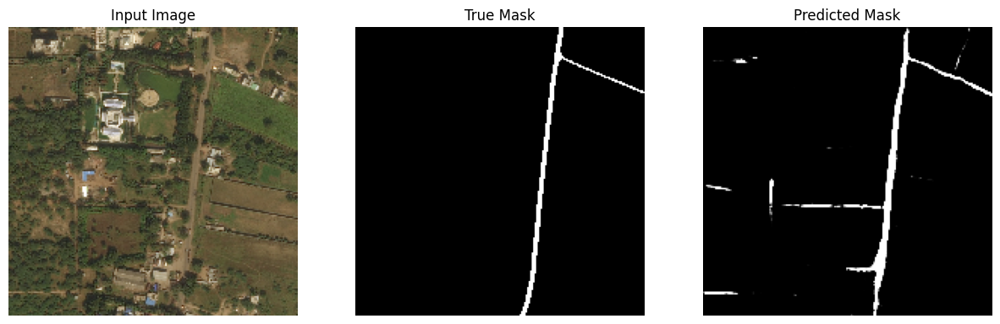

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


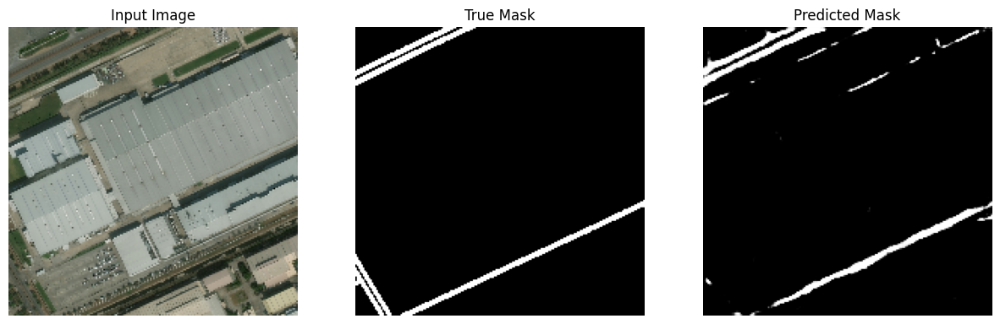

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


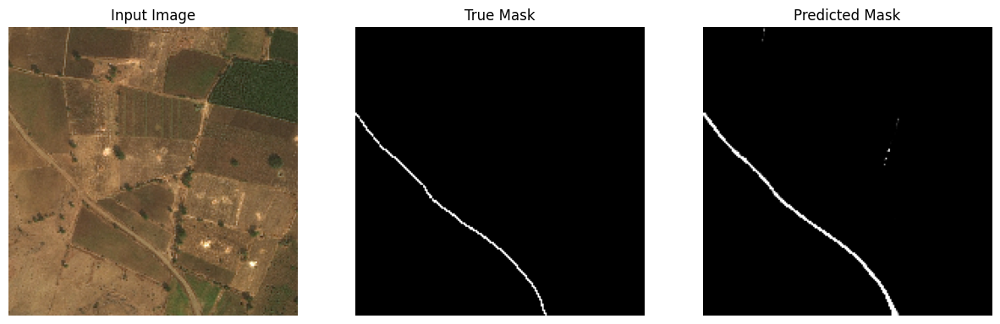

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


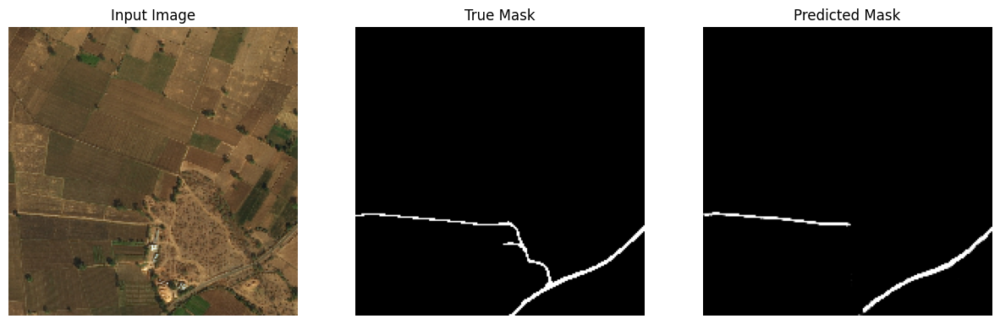

In [96]:
for i in range (20):
    show_predictions(X_test[i], y_test[i])

In [46]:
y_test.shape

(1246, 192, 192, 1)

In [47]:
pred_mask = model.predict(X_test)
# pred_mask = pred_mask.reshape(IMG_SIZE[0],IMG_SIZE[1],1)

39/39 ━━━━━━━━━━━━━━━━━━━━ 1s 16ms/step


In [48]:
pred_mask.shape

(1246, 192, 192, 1)

In [42]:
def precision_score_(groundtruth_mask, pred_mask):
    intersect = np.sum(pred_mask*groundtruth_mask)
    total_pixel_pred = np.sum(pred_mask)
    precision = np.mean(intersect/total_pixel_pred)
    return round(precision, 3)

def recall_score_(groundtruth_mask, pred_mask):
    intersect = np.sum(pred_mask*groundtruth_mask)
    total_pixel_truth = np.sum(groundtruth_mask)
    recall = np.mean(intersect/total_pixel_truth)
    return round(recall, 3)

def accuracy(groundtruth_mask, pred_mask):
    intersect = np.sum(pred_mask*groundtruth_mask)
    union = np.sum(pred_mask) + np.sum(groundtruth_mask) - intersect
    xor = np.sum(groundtruth_mask==pred_mask)
    acc = np.mean(xor/(union + xor - intersect))
    return round(acc, 3)

def dice_coef(groundtruth_mask, pred_mask):
    intersect = np.sum(pred_mask*groundtruth_mask)
    total_sum = np.sum(pred_mask) + np.sum(groundtruth_mask)
    dice = np.mean(2*intersect/total_sum)
    return round(dice, 3)

def iou(groundtruth_mask, pred_mask):
    intersect = np.sum(pred_mask*groundtruth_mask)
    union = np.sum(pred_mask) + np.sum(groundtruth_mask) - intersect
    iou = np.mean(intersect/union)
    return round(iou, 3)

In [43]:
def metrics_table(gt_masks, pred_masks):
    metrics = {'Precision':[],'Recall':[],'Accuracy':[],'Dice':[],'IoU':[]}
    for i, (mask, pred) in enumerate(zip(gt_masks, pred_masks)):
        metrics['Precision'].append(precision_score_(mask, pred))
        metrics['Recall'].append(recall_score_(mask, pred))
        metrics['Accuracy'].append(accuracy(mask, pred))
        metrics['Dice'].append(dice_coef(mask, pred))
        metrics['IoU'].append(iou(mask, pred))
    df = pd.DataFrame.from_dict(metrics)
    df.columns = ['Precision', 'Recall', 'Accuracy', 'Dice', 'IoU']
    return df

In [1]:
metrics_table(y_test, pred_mask)

NameError: name 'metrics_table' is not defined

In [45]:
accuracy(y_test,pred_mask)

0.0

In [97]:
from tensorflow.keras import Sequential

In [98]:
def upsample(filters, size, strides, dropout=None):
    """Upsample the input"""

    initializer = tf.random_normal_initializer(0., 0.02)

    result = Sequential()
    result.add(tf.keras.layers.Conv2DTranspose(filters, size, strides=strides,
                                      padding="same",
                                      kernel_initializer=initializer,
                                      use_bias=False))
    result.add(tf.keras.layers.BatchNormalization())
    if dropout:
        result.add(tf.keras.layers.Dropout(dropout))
    result.add(tf.keras.layers.ReLU())
    return result

In [99]:
from tensorflow.keras.applications import VGG19

base_model = VGG19(input_shape=[192,192] + [3], include_top=False, weights="imagenet")

layers_names = [
    "block2_conv1",    # 256x256
    "block2_conv2",    # 256x256
    "block3_conv1",    # 128x128
    "block3_conv2",    # 128x128
    "block4_conv1",    # 64x64
    "block4_conv2",    # 64x64
    "block5_conv1",    # 32x32
]

layers = [base_model.get_layer(name).output for name in layers_names]
down_stack = Model(inputs=base_model.input, outputs=layers)
down_stack.trainable = False

up_stack = [
    upsample(512, 3, 1),   # 32x32 -> 32x32
    upsample(512, 3, 2),   # 32x32 -> 64x64
    upsample(256, 3, 1),   # 64x64 -> 64x64
    upsample(256, 3, 2),   # 64x64 -> 128x128
    upsample(128, 3, 1),   # 128x128 -> 128x128
    upsample(128, 3, 2),   # 128x128 -> 256x256
]

80134624/80134624 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [100]:
keras.backend.clear_session()

def unet_generator(output_channels=1):
    inputs = tf.keras.layers.Input(shape=[192,192] + [3])
    x = inputs

    initializer = tf.random_normal_initializer(0., 0.02)
    output = tf.keras.layers.Conv2DTranspose(
        output_channels, 3, strides=2, activation='sigmoid',
        padding="same", kernel_initializer=initializer
    )

    concat = tf.keras.layers.Concatenate()

    # Downsampling
    skips = down_stack(x)
    x = skips[-1]
    skips = reversed(skips[:-1])

    # Upsampling and establishing the skip connection
    for up, skip in zip (up_stack, skips):
        x = up(x)
        if up.layers[0].strides == (2, 2):
            concat = tf.keras.layers.Concatenate()
            x = concat([x, skip])

    x = output(x)

    return tf.keras.Model(inputs=inputs, outputs=x)

model = unet_generator()

In [101]:
early_stopping_cb = tf.keras.callbacks.EarlyStopping(patience=4,
                                                    restore_best_weights=True)

In [102]:
IMG_SIZE = [192, 192]
def visualize(display_list):
    plt.figure(figsize=(15, 15))
    title = ['Input Image', 'True Mask', 'Predicted Mask']
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i])
        plt.imshow(tf.keras.preprocessing.image.array_to_img(display_list[i]))
        plt.axis('off')
    plt.show()

def show_predictions(sample_image, sample_mask):
    pred_mask = model.predict(sample_image[tf.newaxis, ...])
    pred_mask = pred_mask.reshape(IMG_SIZE[0],IMG_SIZE[1],1)
    visualize([sample_image, sample_mask, pred_mask])

Epoch 1/50


2024-07-03 10:32:16.121516: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 3.93005, expected 3.20164
2024-07-03 10:32:16.124700: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 2: 4.89311, expected 4.1647
2024-07-03 10:32:16.124713: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 4.49051, expected 3.7621
2024-07-03 10:32:16.124721: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4: 4.81603, expected 4.08762
2024-07-03 10:32:16.124729: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 5: 4.91776, expected 4.18935
2024-07-03 10:32:16.124736: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 6: 5.75233, expected 5.02392
2024-07-03 10:32:16.124744: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 7: 3.66767, expected 2.93926
2024-07-03 10:32:16.124751: E external/local_xla/xla/serv

155/156 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step - accuracy: 0.9145 - loss: 4.6066

2024-07-03 10:33:03.757941: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 3.08295, expected 2.14087
2024-07-03 10:33:03.757995: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 1: 4.20048, expected 3.2584
2024-07-03 10:33:03.758005: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 2: 3.28023, expected 2.33815
2024-07-03 10:33:03.758012: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 4.03549, expected 3.0934
2024-07-03 10:33:03.758020: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4: 3.25131, expected 2.30923
2024-07-03 10:33:03.758028: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 5: 3.64123, expected 2.69915
2024-07-03 10:33:03.758035: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 6: 4.45269, expected 3.51061
2024-07-03 10:33:03.758043: E external/local_xla/xla/serv

156/156 ━━━━━━━━━━━━━━━━━━━━ 0s 261ms/step - accuracy: 0.9146 - loss: 4.5899

2024-07-03 10:33:29.531818: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 4.57581, expected 3.84412
2024-07-03 10:33:29.531878: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 2: 5.55712, expected 4.82543
2024-07-03 10:33:29.531890: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 4.71351, expected 3.98182
2024-07-03 10:33:29.531904: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4: 5.0707, expected 4.33901
2024-07-03 10:33:29.531921: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 5: 5.89076, expected 5.15907
2024-07-03 10:33:29.531934: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 6: 5.66364, expected 4.93195
2024-07-03 10:33:29.531944: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 7: 4.28743, expected 3.55574
2024-07-03 10:33:29.531954: E external/local_xla/xla/ser

156/156 ━━━━━━━━━━━━━━━━━━━━ 91s 386ms/step - accuracy: 0.9147 - loss: 4.5735 - val_accuracy: 0.9106 - val_loss: 0.4822
Epoch 2/50
156/156 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - accuracy: 0.9410 - loss: 0.4159 - val_accuracy: 0.9489 - val_loss: 0.2536
Epoch 3/50
156/156 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - accuracy: 0.9470 - loss: 0.2806 - val_accuracy: 0.9561 - val_loss: 0.2155
Epoch 4/50
156/156 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - accuracy: 0.9482 - loss: 0.3078 - val_accuracy: 0.9407 - val_loss: 0.7160
Epoch 5/50
156/156 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - accuracy: 0.9460 - loss: 0.3668 - val_accuracy: 0.9573 - val_loss: 0.4981
Epoch 6/50
156/156 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - accuracy: 0.9485 - loss: 0.3347 - val_accuracy: 0.9198 - val_loss: 0.3168
Epoch 7/50
156/156 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - accuracy: 0.9492 - loss: 0.2861 - val_accuracy: 0.9027 - val_loss: 0.3067
Epoch 8/50
156/156 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - accuracy: 0.9450 - loss: 0.4376 - val

2024-07-03 10:36:54.741374: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 0: 3.58214, expected 2.80202
2024-07-03 10:36:54.741423: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 1: 6.5387, expected 5.75857
2024-07-03 10:36:54.741439: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 2: 4.33771, expected 3.55759
2024-07-03 10:36:54.741451: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 3: 4.72697, expected 3.94685
2024-07-03 10:36:54.741461: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 4: 5.65111, expected 4.87098
2024-07-03 10:36:54.741471: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 5: 4.18827, expected 3.40815
2024-07-03 10:36:54.741484: E external/local_xla/xla/service/gpu/buffer_comparator.cc:1137] Difference at 6: 5.78111, expected 5.00098
2024-07-03 10:36:54.741506: E external/local_xla/xla/ser

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


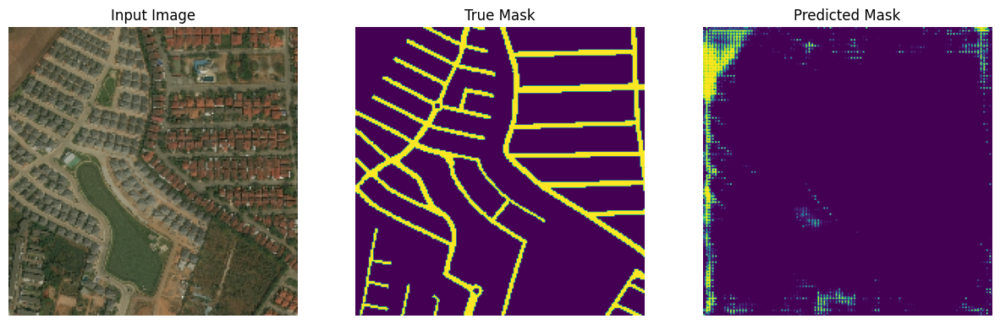

Epoch 10/50
156/156 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - accuracy: 0.9466 - loss: 0.6790 - val_accuracy: 0.9389 - val_loss: 0.2861
Epoch 11/50
156/156 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - accuracy: 0.9516 - loss: 0.2438 - val_accuracy: 0.8874 - val_loss: 0.4669
Epoch 12/50
156/156 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - accuracy: 0.9505 - loss: 0.3089 - val_accuracy: 0.9350 - val_loss: 0.1942
Epoch 13/50
156/156 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - accuracy: 0.9527 - loss: 0.2570 - val_accuracy: 0.9521 - val_loss: 0.2800
Epoch 14/50
156/156 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - accuracy: 0.9540 - loss: 0.2229 - val_accuracy: 0.9575 - val_loss: 0.2918
Epoch 15/50
156/156 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - accuracy: 0.9515 - loss: 0.2946 - val_accuracy: 0.9434 - val_loss: 0.5667
Epoch 16/50
156/156 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - accuracy: 0.9518 - loss: 0.2942 - val_accuracy: 0.9431 - val_loss: 0.3538
Epoch 17/50
156/156 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - accuracy: 0.9538 -

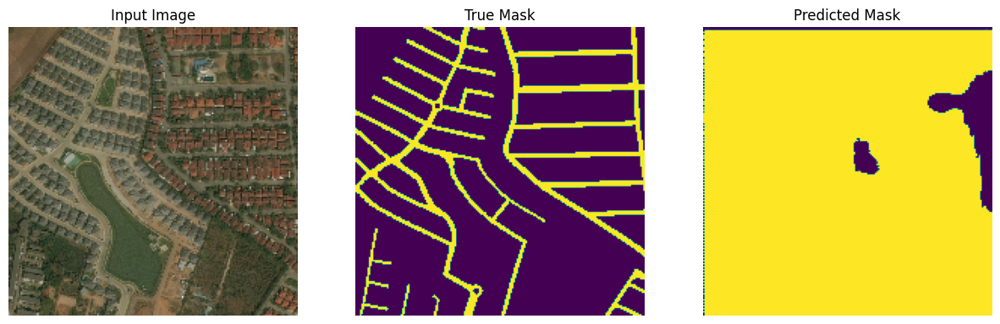

Epoch 20/50
156/156 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - accuracy: 0.9561 - loss: 0.2064 - val_accuracy: 0.9158 - val_loss: 0.3571
Epoch 21/50
156/156 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - accuracy: 0.9531 - loss: 0.2646 - val_accuracy: 0.9540 - val_loss: 0.3931
Epoch 22/50
156/156 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - accuracy: 0.9582 - loss: 0.2197 - val_accuracy: 0.8528 - val_loss: 0.6104
Epoch 23/50
156/156 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - accuracy: 0.9554 - loss: 0.3008 - val_accuracy: 0.9543 - val_loss: 0.6284
Epoch 24/50
156/156 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - accuracy: 0.9568 - loss: 0.3038 - val_accuracy: 0.9606 - val_loss: 0.3437
Epoch 25/50
156/156 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - accuracy: 0.9597 - loss: 0.1852 - val_accuracy: 0.9606 - val_loss: 0.2077
Epoch 26/50
156/156 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - accuracy: 0.9593 - loss: 0.2295 - val_accuracy: 0.9205 - val_loss: 0.3117
Epoch 27/50
156/156 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - accuracy: 0.9560 -

In [ ]:

epochs = 50

class DisplayCallback(tf.keras.callbacks.Callback):
    def on_epoch_begin(self, epoch, logs=None):
        if (epoch + 1) % 10 == 0:
            show_predictions(X_test[0], y_test[0])

model.compile(optimizer='adam',
              loss=tf.keras.losses.BinaryCrossentropy(),
              metrics=['accuracy'])
model_history = model.fit(X_train,y_train, epochs=epochs,
                          validation_data=(X_test, y_test),
                          callbacks=[DisplayCallback()])

In [ ]:
# show_predictions(X_test[555], y_test[555])